In [ ]:
!pip install pydicom
!pip install opencv-python
!pip install -U albumentations
!pip install tqdm

  Obtaining dependency information for pydicom from https://files.pythonhosted.org/packages/27/a6/98651e752a49f341aa99aa3f6c8ba361728dfc064242884355419df63669/pydicom-3.0.1-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 68.1 MB/s eta 0:00:0000:01

[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python3 -m pip install --upgrade pip
  Obtaining dependency information for opencv-python from https://files.pythonhosted.org/packages/2c/8b/90eb44a40476fa0e71e05a0283947cfd74a5d36121a11d926ad6f3193cc4/opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 64.7 MB/s eta 0:00:00:00:0100:01

[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python3 -m pip install --upgrade pip
  Obtaining dependency information for albumentations from https://files.pythonhosted.org/packages/97/d3/cf3aab593209d1be5e4bc

In [ ]:
!pip install pyswarm


  Preparing metadata (setup.py) ... done
  Created wheel for pyswarm: filename=pyswarm-0.6-py3-none-any.whl size=4464 sha256=4667c0790040587c910d51375379ff6909603d59516dce8ecf6fd210e79533ab
  Stored in directory: /root/.cache/pip/wheels/bb/4f/ec/8970b83323e16aa95034da175454843947376614d6d5e9627f
Successfully built pyswarm

[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [ ]:
!pip install scikit-learn


  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/a8/f3/62fc9a5a659bb58a03cdd7e258956a5824bdc9b4bb3c5d932f55880be569/scikit_learn-1.6.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for joblib>=1.2.0 from https://files.pythonhosted.org/packages/91/29/df4b9b42f2be0b623cbd5e2140cafcaa2bef0759a00b7b70104dcfe2fb51/joblib-1.4.2-py3-none-any.whl.metadata
  Obtaining dependency information for threadpoolctl>=3.1.0 from https://files.pythonhosted.org/packages/32/d5/f9a850d79b0851d1d4ef6456097579a9005b31fea68726a4ae5f2d82ddd9/threadpoolctl-3.6.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 165.5 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.8/301.8 kB 151.1 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [ ]:
!git clone https://github.com/sauravmishra1710/UNet-Plus-Plus---Brain-Tumor-Segmentation.git



fatal: destination path 'UNet-Plus-Plus---Brain-Tumor-Segmentation' already exists and is not an empty directory.


In [ ]:
!nvidia-smi

Sun Apr 13 13:37:19 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.127.05             Driver Version: 550.127.05     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX 6000 Ada Gene...    On  |   00000000:81:00.0 Off |                  Off |
| 30%   32C    P8             24W /  300W |       2MiB /  49140MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install opencv-python



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [ ]:
#checking Pixel intensity values
#The DICOM images contain both negative and positive intensity values representing Hounsfield Units (HU),
#which is characteristic of CT imaging. For example, air appears around
#-1000 HU, soft tissues like the liver are generally 40-70 HU, and denser materials like bone can be above 1000 HU

In [ ]:
import os
import numpy as np
import pydicom

# Set folders with correct paths
image_folder = "/workspace/data/train/images"
mask_folder = "/workspace/data/train/masks"

# Get first 5 images and masks
image_files = sorted(os.listdir(image_folder))[:5]
mask_files = sorted(os.listdir(mask_folder))[:5]

# Function to get unique values in images and masks
def unique_values_in_images(image_folder, mask_folder, image_files, mask_files):
    for i, (image_file, mask_file) in enumerate(zip(image_files, mask_files)):
        image_path = os.path.join(image_folder, image_file)
        mask_path = os.path.join(mask_folder, mask_file)

        # Load image (DICOM format)
        image_pixel_array = pydicom.dcmread(image_path).pixel_array

        # Load mask (DICOM format)
        mask_pixel_array = pydicom.dcmread(mask_path).pixel_array

        # Get unique pixel values
        unique_image_values = np.unique(image_pixel_array)
        unique_mask_values = np.unique(mask_pixel_array)

        print(f"Image {i+1} ({image_file}): Unique Values -> {unique_image_values}")
        print(f"Mask {i+1} ({mask_file}): Unique Values -> {unique_mask_values}")
        print("-" * 50)

# Run the function
unique_values_in_images(image_folder, mask_folder, image_files, mask_files)


Image 1 (file_0001): Unique Values -> [-1024 -1023 -1022 ...  1016  1017  1023]
Mask 1 (file_0001): Unique Values -> [  0 255]
--------------------------------------------------
Image 2 (file_0002): Unique Values -> [-1024 -1023 -1022 ...  1021  1022  1023]
Mask 2 (file_0002): Unique Values -> [  0 255]
--------------------------------------------------
Image 3 (file_0003): Unique Values -> [-2048 -1132 -1129 ...  1442  1470  1472]
Mask 3 (file_0003): Unique Values -> [  0 255]
--------------------------------------------------
Image 4 (file_0004): Unique Values -> [-2048 -1140 -1138 ...  1436  1442  1444]
Mask 4 (file_0004): Unique Values -> [  0 255]
--------------------------------------------------
Image 5 (file_0005): Unique Values -> [-2048 -1150 -1132 ...  1414  1430  1446]
Mask 5 (file_0005): Unique Values -> [  0 255]
--------------------------------------------------


In [ ]:
#initially:
#Total masks: 2063
#Black masks (no tumor): 1495
#Tumor masks (with tumor): 568
#then take balance dataset
#lastly take image-masks pairs that contains only tumors (568)

In [ ]:
import os

# Define the correct absolute paths to your directories
train_img_path = "/workspace/data/train/images"
train_mask_path = "/workspace/data/train/masks"

valid_img_path = "/workspace/data/valid/images"
valid_mask_path = "/workspace/data/valid/masks"

test_img_path = "/workspace/data/test/images"
test_mask_path = "/workspace/data/test/masks"

# Function to get image IDs (filenames) from the directory
def get_image_ids(img_path):
    return sorted(os.listdir(img_path))  # Sorted for consistency

# Create image IDs for training, validation, and testing
train_image_ids = get_image_ids(train_img_path)
valid_image_ids = get_image_ids(valid_img_path)
test_image_ids = get_image_ids(test_img_path)

# Print the number of image IDs to check
print(f"Train images: {len(train_image_ids)}")
print(f"Valid images: {len(valid_image_ids)}")
print(f"Test images: {len(test_image_ids)}")

# Print the first few filenames to verify
print("Sample train images:", train_image_ids[:5])
print("Sample valid images:", valid_image_ids[:5])
print("Sample test images:", test_image_ids[:5])


Train images: 794
Valid images: 170
Test images: 172
Sample train images: ['file_0001', 'file_0002', 'file_0003', 'file_0004', 'file_0005']
Sample valid images: ['file_0001', 'file_0002', 'file_0003', 'file_0004', 'file_0005']
Sample test images: ['file_0001', 'file_0002', 'file_0003', 'file_0004', 'file_0005']


In [ ]:
#convert dicom images to png

In [ ]:
import os
import cv2
import pydicom
import numpy as np

def convert_dicom_to_png_format_only(image_dir, mask_dir, output_img_dir, output_mask_dir):
    os.makedirs(output_img_dir, exist_ok=True)
    os.makedirs(output_mask_dir, exist_ok=True)

    dicom_files = sorted(os.listdir(image_dir))

    for file in dicom_files:
        # --- Convert Image ---
        img_path = os.path.join(image_dir, file)
        dicom_img = pydicom.dcmread(img_path)
        image = dicom_img.pixel_array

        # Normalize to 8-bit for PNG (only format change, no rescaling)
        image = image.astype(np.float32)
        image = (255 * (image - np.min(image)) / (np.max(image) - np.min(image))).astype(np.uint8)

        # Save as PNG
        png_name = file + ".png"
        cv2.imwrite(os.path.join(output_img_dir, png_name), image)

        # --- Convert Mask (if exists) ---
        mask_path = os.path.join(mask_dir, file)
        if os.path.exists(mask_path):
            dicom_mask = pydicom.dcmread(mask_path)
            mask = dicom_mask.pixel_array
            mask = (mask > 0).astype(np.uint8) * 255  # Binary for PNG
            cv2.imwrite(os.path.join(output_mask_dir, png_name), mask)

    print("✅ All DICOMs converted to PNG ")
image_dir="/workspace/data/train/images"
mask_dir="/workspace/data/train/masks"
images_png="/workspace/data/train_png/images"
masks_png="/workspace/data/train_png/masks"
convert_dicom_to_png_format_only(image_dir, mask_dir, images_png, masks_png)

✅ All DICOMs converted to PNG 


In [ ]:
#Do the same for valid and test
image_dir="/workspace/data/valid/images"
mask_dir="/workspace/data/valid/masks"
images_png="/workspace/data/valid_png/images"
masks_png="/workspace/data/valid_png/masks"
convert_dicom_to_png_format_only(image_dir, mask_dir, images_png, masks_png)
############################################################################
image_dir="/workspace/data/test/images"
mask_dir="/workspace/data/test/masks"
images_png="/workspace/data/test_png/images"
masks_png="/workspace/data/test_png/masks"
convert_dicom_to_png_format_only(image_dir, mask_dir, images_png, masks_png)

✅ All DICOMs converted to PNG 
✅ All DICOMs converted to PNG 


In [ ]:
#split cleand masks on merged_containstumors_png folder

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split
import random

# Paths
input_images_dir = "/workspace/data/merged_containstumors_png/images"
input_masks_dir = "/workspace/data/merged_containstumors_png/masks"

output_base = "/workspace/data/final_split_balanced"
splits = ["train", "valid", "test"]

# Step 1: Prepare output folders
for split in splits:
    os.makedirs(os.path.join(output_base, split, "images"), exist_ok=True)
    os.makedirs(os.path.join(output_base, split, "masks"), exist_ok=True)

# Step 2: Get all paired file names
all_filenames = sorted([
    f for f in os.listdir(input_images_dir)
    if os.path.isfile(os.path.join(input_images_dir, f)) and f.endswith(".png")
])

# Shuffle for randomness
random.seed(42)
random.shuffle(all_filenames)

# Step 3: Split into 80/10/10
train_files, val_test = train_test_split(all_filenames, test_size=0.2, random_state=42)
val_files, test_files = train_test_split(val_test, test_size=0.5, random_state=42)

split_map = {
    "train": train_files,
    "valid": val_files,
    "test": test_files
}

# Step 4: Copy the files
for split, files in split_map.items():
    for filename in files:
        # Source paths
        img_src = os.path.join(input_images_dir, filename)
        mask_src = os.path.join(input_masks_dir, filename)

        # Destination paths
        img_dst = os.path.join(output_base, split, "images", filename)
        mask_dst = os.path.join(output_base, split, "masks", filename)

        shutil.copy(img_src, img_dst)
        shutil.copy(mask_src, mask_dst)

    print(f"✅ {split.capitalize()} set: {len(files)} image–mask pairs")

print("✅ Splitting complete! Data saved in /workspace/data/final_split_balanced/")


✅ Train set: 454 image–mask pairs
✅ Valid set: 57 image–mask pairs
✅ Test set: 57 image–mask pairs
✅ Splitting complete! Data saved in /workspace/data/final_split_balanced/


In [ ]:
#Data Augmentation
#Elastic transformations simulate realistic, non-rigid deformations by smoothly distorting the image — like “bending” it, mimicking tissue deformation.values provide  moderate elastic deformation
#translation to teach the model location-invariant features
#flipping helps in the model generalizability

In [ ]:
import os
import cv2
import numpy as np
import albumentations as A

# Original image/mask directories
image_dir = '/workspace/data/final_split_balanced/train/images'
mask_dir = '/workspace/data/final_split_balanced/train/masks'

# Augmented image/mask save directories
aug_image_dir = '/workspace/data/final_split_balanced/augmentedtrain/images'
aug_mask_dir = '/workspace/data/final_split_balanced/augmentedtrain/masks'

os.makedirs(aug_image_dir, exist_ok=True)
os.makedirs(aug_mask_dir, exist_ok=True)

# Albumentations transforms
elastic = A.ElasticTransform(alpha=50, sigma=6, p=1.0)

translate = A.Affine(
    translate_px={"x": (-10, 10), "y": (-10, 10)},
    scale=1.0,
    rotate=0,
    p=1.0,
    fit_output=False,
    border_mode=cv2.BORDER_REFLECT
)

flip = A.HorizontalFlip(p=1.0)

# Process all images
image_files = sorted(os.listdir(image_dir))

for filename in image_files:
    # Load grayscale image and mask
    img_path = os.path.join(image_dir, filename)
    mask_path = os.path.join(mask_dir, filename)

    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = (mask > 0).astype(np.uint8)

    # Albumentations expects HWC format
    image = np.expand_dims(image, axis=-1)
    mask = np.expand_dims(mask, axis=-1)

    # ---- Save Original Image and Mask ----
    cv2.imwrite(os.path.join(aug_image_dir, filename), image.squeeze())
    cv2.imwrite(os.path.join(aug_mask_dir, filename), mask.squeeze() * 255)

    # ---- Elastic Augmentation ----
    augmented = elastic(image=image, mask=mask)
    elastic_img = augmented["image"]
    elastic_mask = augmented["mask"]
    elastic_img_name = filename.replace(".png", "_elastic.png")
    elastic_mask_name = filename.replace(".png", "_elastic.png")
    cv2.imwrite(os.path.join(aug_image_dir, elastic_img_name), elastic_img)
    cv2.imwrite(os.path.join(aug_mask_dir, elastic_mask_name), elastic_mask * 255)

    # ---- Translation Augmentation ----
    augmented = translate(image=image, mask=mask)
    trans_img = augmented["image"]
    trans_mask = augmented["mask"]
    trans_img_name = filename.replace(".png", "_translated.png")
    trans_mask_name = filename.replace(".png", "_translated.png")
    cv2.imwrite(os.path.join(aug_image_dir, trans_img_name), trans_img)
    cv2.imwrite(os.path.join(aug_mask_dir, trans_mask_name), trans_mask * 255)

    # ---- Horizontal Flip Augmentation ----
    augmented = flip(image=image, mask=mask)
    flip_img = augmented["image"]
    flip_mask = augmented["mask"]
    flip_img_name = filename.replace(".png", "_flip.png")
    flip_mask_name = filename.replace(".png", "_flip.png")
    cv2.imwrite(os.path.join(aug_image_dir, flip_img_name), flip_img)
    cv2.imwrite(os.path.join(aug_mask_dir, flip_mask_name), flip_mask * 255)

print("✅ All originals and augmented images (elastic, translation, flip) saved successfully!")


✅ All originals and augmented images (elastic, translation, flip) saved successfully!


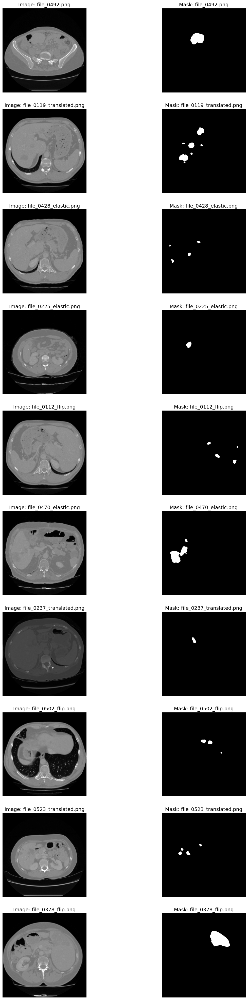

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import random

# Paths
aug_image_dir = '/workspace/data/final_split_balanced/augmentedtrain/images'
aug_mask_dir = '/workspace/data/final_split_balanced/augmentedtrain/masks'

# Get 10 random file names
all_files = sorted([f for f in os.listdir(aug_image_dir) if f.endswith('.png')])
selected_files = random.sample(all_files, 10)

# Plotting
plt.figure(figsize=(16, 40))  # <-- Increased height and width

for i, filename in enumerate(selected_files):
    img_path = os.path.join(aug_image_dir, filename)
    mask_path = os.path.join(aug_mask_dir, filename)

    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Image
    plt.subplot(10, 2, 2*i + 1)
    plt.imshow(image, cmap='gray')
    plt.title(f"Image: {filename}", fontsize=14)
    plt.axis('off')

    # Mask
    plt.subplot(10, 2, 2*i + 2)
    plt.imshow(mask, cmap='gray')
    plt.title(f"Mask: {filename}", fontsize=14)
    plt.axis('off')

plt.tight_layout(pad=3.0)  # More padding between rows
plt.show()


In [ ]:
import os

# Define the correct absolute paths to your directories

# Original training set (before augmentation)
original_train_img_path = "/workspace/data/final_split_balanced/train/images"
original_train_mask_path = "/workspace/data/final_split_balanced/train/masks"

# Augmented training set (after augmentation)
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"

# Validation and test sets
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

test_img_path = "/workspace/data/final_split_balanced/test/images"
test_mask_path = "/workspace/data/final_split_balanced/test/masks"
# Function to get image IDs (filenames) from the directory
def get_image_ids(img_path):
    return sorted(os.listdir(img_path))  # Sorted for consistency
# Function to get image-mask pairs by finding common filenames
def get_image_mask_pairs(img_path, mask_path):
    img_files = set(os.listdir(img_path))
    mask_files = set(os.listdir(mask_path))
    common_files = img_files.intersection(mask_files)
    return sorted(common_files)
# Create image IDs for training, validation, and testing
train_image_ids = get_image_ids(train_img_path)
valid_image_ids = get_image_ids(valid_img_path)
test_image_ids = get_image_ids(test_img_path)
# Get image-mask pairs
original_train_pairs = get_image_mask_pairs(original_train_img_path, original_train_mask_path)
augmented_train_pairs = get_image_mask_pairs(train_img_path, train_mask_path)
valid_pairs = get_image_mask_pairs(valid_img_path, valid_mask_path)
test_pairs = get_image_mask_pairs(test_img_path, test_mask_path)

# Print sample filenames
print("\nSample original train images:", original_train_pairs[:5])
print("Sample augmented train images:", augmented_train_pairs[:5])
print("Sample valid images:", valid_pairs[:5])
print("Sample test images:", test_pairs[:5])


# Print counts
print(f"Original training image-mask pairs (before augmentation): {len(original_train_pairs)}")
print(f"Augmented training image-mask pairs (after augmentation): {len(augmented_train_pairs)}")
print(f"Validation image-mask pairs: {len(valid_pairs)}")
print(f"Test image-mask pairs: {len(test_pairs)}")




Sample original train images: ['file_0001.png', 'file_0002.png', 'file_0003.png', 'file_0004.png', 'file_0005.png']
Sample augmented train images: ['file_0001.png', 'file_0001_elastic.png', 'file_0001_flip.png', 'file_0001_translated.png', 'file_0002.png']
Sample valid images: ['file_0009.png', 'file_0015.png', 'file_0021.png', 'file_0037.png', 'file_0042.png']
Sample test images: ['.ipynb_checkpoints', 'file_0006.png', 'file_0011.png', 'file_0012.png', 'file_0013.png']
Original training image-mask pairs (before augmentation): 454
Augmented training image-mask pairs (after augmentation): 1816
Validation image-mask pairs: 57
Test image-mask pairs: 58


In [ ]:
import os
import random
import numpy as np
import cv2
import gc
import pydicom
import tensorflow as tf


class DICOMDataGen(tf.keras.utils.Sequence):
    """
    Custom data generator for PNG images and binary masks.
    Assumes grayscale images and masks.
    """

    def __init__(self, image_ids, img_path, mask_path, batch_size=32, image_size=512, shuffle=True):
        self.ids = image_ids
        self.img_path = img_path
        self.mask_path = mask_path
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __load__(self, item):
        # Full paths
        full_image_path = os.path.join(self.img_path, item)
        full_mask_path = os.path.join(self.mask_path, item)

        # --- Load image and normalize to [0, 1] ---
        image = cv2.imread(full_image_path, cv2.IMREAD_GRAYSCALE).astype(np.float32)
        image /= 255.0  # normalize

        # --- Load mask and binarize to {0, 1} ---
        mask = cv2.imread(full_mask_path, cv2.IMREAD_GRAYSCALE).astype(np.float32)
        mask = (mask >= 255).astype(np.float32)  # threshold

        # Resize to target size
        image = cv2.resize(image, (self.image_size, self.image_size), interpolation=cv2.INTER_LINEAR)
        mask = cv2.resize(mask, (self.image_size, self.image_size), interpolation=cv2.INTER_NEAREST)

        # Add channel dimension
        image = np.expand_dims(image, axis=-1)
        mask = np.expand_dims(mask, axis=-1)

        return image, mask

    def __getitem__(self, index):
        # Adjust batch size at the end of the dataset
        if (index + 1) * self.batch_size > len(self.ids):
            self.batch_size = len(self.ids) - index * self.batch_size

        batch = self.ids[index * self.batch_size : (index + 1) * self.batch_size]
        images, masks = zip(*(self.__load__(item) for item in batch))

        return np.array(images), np.array(masks)

    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.ids)
        gc.collect()

    def __len__(self):
        return int(np.ceil(len(self.ids) / float(self.batch_size)))



2025-04-13 13:37:48.464948: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-13 13:37:48.496884: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-13 13:37:48.496915: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-13 13:37:48.496942: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-13 13:37:48.503770: I tensorflow/core/platform/cpu_feature_g

In [ ]:
image_size = 256
image_channels = 1
epochs = 30
batch_size = 4

In [ ]:
# Create instances of DICOMDataGen for training, validation, and testing
train_gen = DICOMDataGen(
    image_ids=train_image_ids,
    img_path=train_img_path,
    mask_path=train_mask_path,
    batch_size=batch_size,
    image_size=image_size,
    shuffle=True
)

valid_gen = DICOMDataGen(
    image_ids=valid_image_ids,
    img_path=valid_img_path,
    mask_path=valid_mask_path,
    batch_size=batch_size,
    image_size=image_size,
    shuffle=True
)

test_gen = DICOMDataGen(
    image_ids=test_image_ids,
    img_path=test_img_path,
    mask_path=test_mask_path,
    batch_size=batch_size,
    image_size=image_size,
    shuffle=False
)


🖼️ Image min: 0.0 | max: 1.0 | dtype: float32
🎭 Mask min: 0.0 | max: 1.0 | dtype: float32
🎯 Unique mask values: [0. 1.]


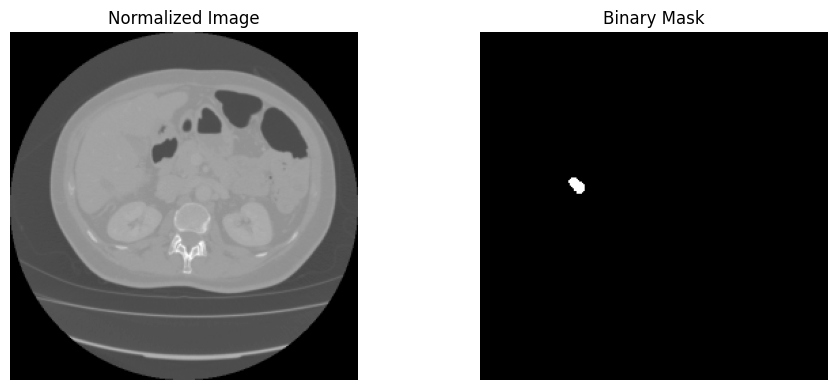

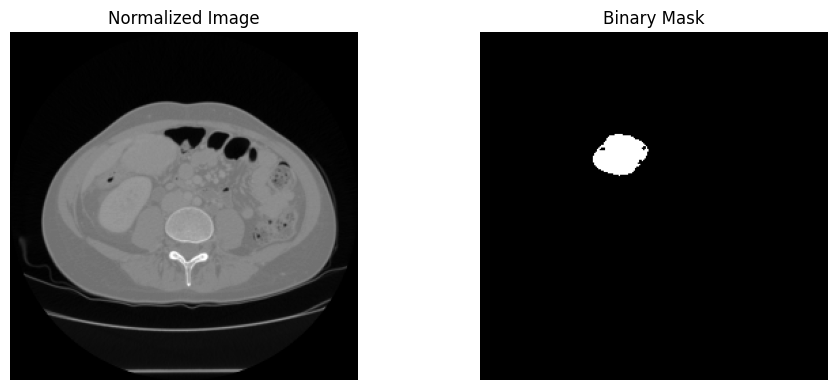

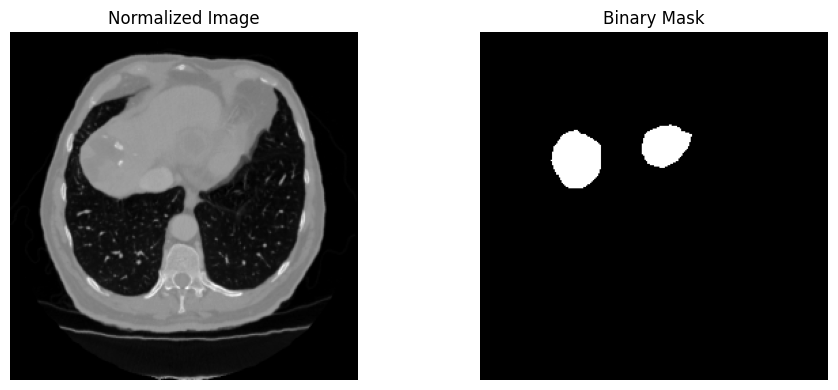

In [ ]:
# Grab a sample batch (e.g., the first one)
images, masks = train_gen[0]  # You can use valid_gen[0] or test_gen[0] too

# Inspect image range
print("🖼️ Image min:", images.min(), "| max:", images.max(), "| dtype:", images.dtype)

# Inspect mask range and unique values
print("🎭 Mask min:", masks.min(), "| max:", masks.max(), "| dtype:", masks.dtype)
print("🎯 Unique mask values:", np.unique(masks))

# Visualize a few samples
import matplotlib.pyplot as plt

for i in range(3):  # Show first 3 examples
    plt.figure(figsize=(10, 4))

    # Show image
    plt.subplot(1, 2, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    # Show mask
    plt.subplot(1, 2, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title('Binary Mask')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
train_steps = len(train_image_ids)//batch_size
valid_steps = len(valid_image_ids)//batch_size
train_steps, valid_steps

(454, 14)

In [ ]:
import numpy as np
images, masks = train_gen[2]
assert not np.any(np.isnan(images))
assert not np.any(np.isnan(masks))


In [ ]:
images, masks = train_gen[0]
print("Image range:", images.min(), images.max())
print("Mask range:", masks.min(), masks.max())
print("Mask sum (sample):", masks[0].sum())


Image range: 0.0 1.0
Mask range: 0.0 1.0
Mask sum (sample): 161.0


In [ ]:
temp_data_generator = DICOMDataGen(image_ids = train_image_ids,
                                   img_path = train_img_path,
                                   mask_path = train_mask_path,
                                   batch_size = batch_size,
                                   image_size = image_size)

# get one batch of data
images, masks = temp_data_generator.__getitem__(0)
print("Batch Dimension Details:", images.shape, masks.shape)

Batch Dimension Details: (4, 256, 256, 1) (4, 256, 256, 1)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.losses import BinaryCrossentropy

# Reusable functions
def VisualizeImageAndMask(image, mask, prediction_img=None):
    """
    Displays the image, mask, and the predicted mask of the input image.

    Args:
        image: the original image.
        mask: the given mask of the image.
        prediction_img: the predicted mask of the image.

    Return:
        None
    """
    fig = plt.figure()
    fig.subplots_adjust(hspace=0.6, wspace=0.6)
    fig.suptitle('Image & Mask(s)', fontsize=15)
    fig.subplots_adjust(top=1.15)

    ax = fig.add_subplot(1, 3, 1)
    ax.imshow(image, cmap="gray")
    setTitleAndRemoveTicks(ax, 'Original\nImage')

    ax = fig.add_subplot(1, 3, 2)
    ax.imshow(mask, cmap="gray")
    setTitleAndRemoveTicks(ax, 'Original\nMask')

    if prediction_img is not None:
        # prediction_img = prediction_img * 255
        ax = fig.add_subplot(1, 3, 3)
        ax.imshow(np.reshape(prediction_img, (image.shape[0], image.shape[1])), cmap="gray")
        setTitleAndRemoveTicks(ax, 'Predicted\nMask')

def setTitleAndRemoveTicks(axes, title):
    """
    Sets the sub-plot title and removes the
    x & y ticks on the respective axes.

    Args:
        axes: the subplot.
        title: title of the subplot.

    Return:
        None
    """
    # Set plot title
    axes.title.set_text(title)

    # Remove the ticks
    axes.set_xticks([])
    axes.set_yticks([])



#def compile_and_summarize_model(model, optimizer_name='adam', learning_rate=1e-4, clipvalue=1.0, loss_fn=dice_coef_loss):
 #   if optimizer_name == 'adam':
  #      optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate, clipvalue=clipvalue)
   # elif optimizer_name == 'rmsprop':
    #    optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate, clipvalue=clipvalue)
   # else:
    #    optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, clipvalue=clipvalue)
#
 #   model.compile(
  #      optimizer=optimizer,
   #     loss=loss_fn,
    #    metrics=[dice_coef, iou_score]
    #)
    #model.summary()



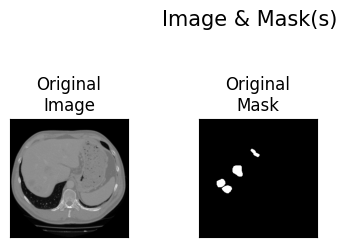

In [ ]:
VisualizeImageAndMask(image = images[3], mask = masks[3])

In [ ]:
images, masks = train_gen[0]
print("Image range:", images.min(), images.max())
print("Mask range:", masks.min(), masks.max())
print("Mask sum (sample):", masks[0].sum())


Image range: 0.0 1.0
Mask range: 0.0 1.0
Mask sum (sample): 5.0


In [ ]:
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras import backend as K
import tensorflow as tf

# Small constant to avoid division by zero
smooth = K.epsilon()
bce_loss = BinaryCrossentropy(from_logits=False)

def dice_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    y_pred = K.clip(y_pred, 0, 1)
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1. - dice_coef(y_true, y_pred)

def iou_score(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    y_pred = K.clip(y_pred, 0, 1)
    y_true = K.clip(y_true, 0, 1)
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def dice_bce_loss(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.clip_by_value(tf.cast(y_pred, tf.float32), 1e-7, 1. - 1e-7)
    bce = bce_loss(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    return bce + dice

def bce_safe(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.clip_by_value(tf.cast(y_pred, tf.float32), 1e-7, 1. - 1e-7)
    return bce_loss(y_true, y_pred)


In [ ]:
import sys
sys.path.append("/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py")


In [ ]:
#build unetplusplus Architecture , load the pretrained model ,freeze encoder weights

In [ ]:
import gc
import h5py
import tensorflow as tf
import sys
import numpy as np
import importlib.util
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras import mixed_precision

# ✅ Enable Mixed Precision to Reduce Memory Usage
mixed_precision.set_global_policy('mixed_float16')

# ✅ Enable GPU Memory Growth (for TensorFlow)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_virtual_device_configuration(
                gpu, [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4096)]
            )
    except RuntimeError as e:
        print(e)

# ✅ Path to the HDF5 model file
file_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
try:
    with h5py.File(file_path, "r") as f:
        print("Valid HDF5 file. Contents:", list(f.keys()))
except Exception as e:
    print("Error opening file:", e)

##########################################################################################################
# ✅ Dynamic import of UNetPlusPlus from UNetPP.py
module_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", module_path)
unetpp_module = importlib.util.module_from_spec(spec)
sys.modules["UNetPP"] = unetpp_module
spec.loader.exec_module(unetpp_module)

UNetPlusPlus = unetpp_module.UNetPlusPlus  # Get the class

##########################################################################################################
# ✅ Initialize Architecture
image_size = 256  # Define this if not already defined
input_shape = (image_size, image_size, 1)
unetpp_model = UNetPlusPlus(input_shape=input_shape, deep_supervision=False)

#################################################################################################
# ✅ Load weights
model = unetpp_model.BuildNetwork()
try:
    model.load_weights(file_path)
    print("✅ Weights loaded successfully!")
except ValueError as e:
    print(f"Error loading weights: {e}")

# ✅ Freeze Encoder Layers
for layer in model.layers:
    if "upsample" in layer.name:
        break
    layer.trainable = False

print("✅ Encoder layers frozen for transfer learning.")

#################################################################################################

#################################################################################################
# ✅ Compile and summarize model
def compile_and_summarize_model(
    model,
    optimizer_name='adam',
    learning_rate=1e-4,
    clipvalue=1.0,
    loss_fn=dice_loss,
    verbose=True
):
    if optimizer_name == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate, clipvalue=clipvalue)
    elif optimizer_name == 'rmsprop':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate, clipvalue=clipvalue)
    else:
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, clipvalue=clipvalue)

    model.compile(
        optimizer=optimizer,
        loss=loss_fn,
        metrics=[dice_coef, iou_score]
    )

    if verbose:
        model.summary()

# Call the function if needed:
compile_and_summarize_model(model)


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA RTX 6000 Ada Generation, compute capability 8.9
Virtual devices cannot be modified after being initialized
Valid HDF5 file. Contents: ['InputLayer', 'X00', 'X00_', 'X01', 'X01_', 'X02', 'X02_', 'X03', 'X03_', 'X04', 'X04_', 'X10', 'X10_', 'X11', 'X11_', 'X12', 'X12_', 'X13', 'X13_', 'X20', 'X20_', 'X21', 'X21_', 'X22', 'X22_', 'X30', 'X30_', 'X31', 'X31_', 'X40', 'X40_', 'concat01', 'concat02', 'concat03', 'concat04', 'concat11', 'concat12', 'concat13', 'concat21', 'concat22', 'concat31', 'conv00_1', 'conv00_2', 'conv01_1', 'conv01_2', 'conv02_1', 'conv02_2', 'conv03_1', 'conv03_2', 'conv04_1', 'conv04_2', 'conv10_1', 'conv10_2', 'conv11_1', 'conv11_2', 'conv12_1', 'conv12_2', 'conv13_1', 'conv13_2', 'conv20_1', 'conv20_2', 'conv21_1', 'conv21_2', 'conv22_1', 'conv22_2', 'conv30_1', 'conv3


🔧 Trying: LR=1e-05, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=40, LOSS=dice_loss
Epoch 1/40
454/454 [==============================] - 27s 46ms/step - loss: 0.9469 - dice_coef: 0.0531 - iou_score: 0.0276 - val_loss: 0.9068 - val_dice_coef: 0.0889 - val_iou_score: 0.0471
Epoch 2/40
454/454 [==============================] - 20s 44ms/step - loss: 0.9328 - dice_coef: 0.0672 - iou_score: 0.0353 - val_loss: 0.9745 - val_dice_coef: 0.0255 - val_iou_score: 0.0135
Epoch 3/40
454/454 [==============================] - 20s 44ms/step - loss: 0.9231 - dice_coef: 0.0769 - iou_score: 0.0409 - val_loss: 0.9944 - val_dice_coef: 0.0056 - val_iou_score: 0.0029
Epoch 4/40
454/454 [==============================] - 21s 47ms/step - loss: 0.9130 - dice_coef: 0.0870 - iou_score: 0.0465 - val_loss: 0.9977 - val_dice_coef: 0.0023 - val_iou_score: 0.0012
Epoch 5/40
454/454 [==============================] - 19s 42ms/step - loss: 0.9068 - dice_coef: 0.0932 - iou_score: 0.0503 - val_loss: 0.9980 - val_dice_coef: 0.002

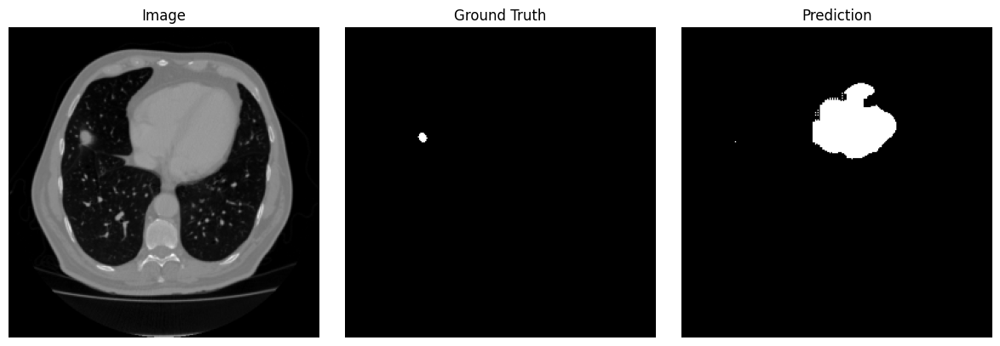


🔧 Trying: LR=0.001, OPT=rmsprop, SIZE=128, BS=4, EPOCHS=80, LOSS=dice_loss
Epoch 1/80
454/454 [==============================] - 24s 40ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9328 - val_dice_coef: 0.0639 - val_iou_score: 0.0368
Epoch 2/80
454/454 [==============================] - 20s 43ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9825 - val_dice_coef: 0.0175 - val_iou_score: 0.0175
Epoch 3/80
454/454 [==============================] - 19s 41ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9678 - val_dice_coef: 0.0322 - val_iou_score: 0.0261
Epoch 4/80
454/454 [==============================] - 19s 42ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9678 - val_dice_coef: 0.0322 - val_iou_score: 0.0261
Epoch 5/80
454/454 [==============================] - 20s 44ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.8770 - val_dice_coef: 0.1230 - val_iou_score: 0.0877
Epoch 6/80
454/454 

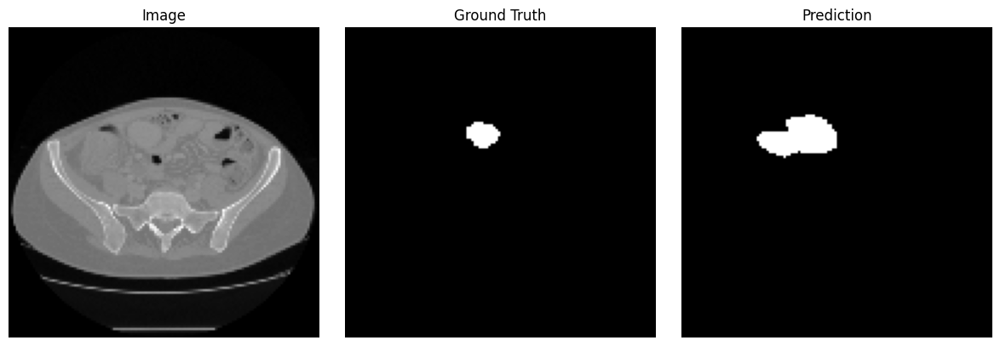


🔧 Trying: LR=0.0001, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=20, LOSS=dice_loss
Epoch 1/20
454/454 [==============================] - 28s 47ms/step - loss: 0.9038 - dice_coef: 0.0962 - iou_score: 0.0524 - val_loss: 0.9920 - val_dice_coef: 0.0082 - val_iou_score: 0.0042
Epoch 2/20
454/454 [==============================] - 21s 46ms/step - loss: 0.8661 - dice_coef: 0.1339 - iou_score: 0.0747 - val_loss: 0.9925 - val_dice_coef: 0.0075 - val_iou_score: 0.0041
Epoch 3/20
454/454 [==============================] - 22s 48ms/step - loss: 0.8466 - dice_coef: 0.1534 - iou_score: 0.0874 - val_loss: 0.9907 - val_dice_coef: 0.0093 - val_iou_score: 0.0052
Epoch 4/20
454/454 [==============================] - 21s 46ms/step - loss: 0.8382 - dice_coef: 0.1618 - iou_score: 0.0934 - val_loss: 0.9940 - val_dice_coef: 0.0060 - val_iou_score: 0.0032
Epoch 5/20
454/454 [==============================] - 20s 44ms/step - loss: 0.8292 - dice_coef: 0.1708 - iou_score: 0.1004 - val_loss: 0.9944 - val_dice_coef: 0.00

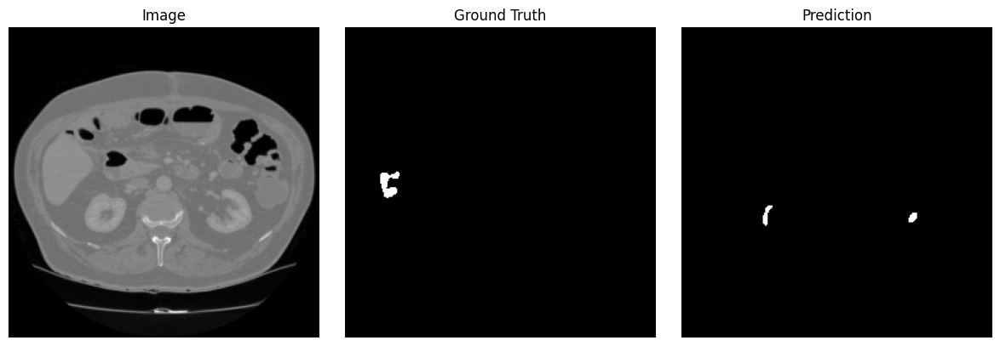


🔧 Trying: LR=1e-05, OPT=adam, SIZE=128, BS=4, EPOCHS=20, LOSS=dice_loss
Epoch 1/20
454/454 [==============================] - 27s 46ms/step - loss: 0.9246 - dice_coef: 0.0754 - iou_score: 0.0401 - val_loss: 0.9912 - val_dice_coef: 0.0083 - val_iou_score: 0.0042
Epoch 2/20
454/454 [==============================] - 21s 46ms/step - loss: 0.9092 - dice_coef: 0.0908 - iou_score: 0.0494 - val_loss: 0.9964 - val_dice_coef: 0.0036 - val_iou_score: 0.0019
Epoch 3/20
454/454 [==============================] - 20s 45ms/step - loss: 0.8896 - dice_coef: 0.1104 - iou_score: 0.0614 - val_loss: 0.9989 - val_dice_coef: 0.0011 - val_iou_score: 5.3308e-04
Epoch 4/20
454/454 [==============================] - 20s 44ms/step - loss: 0.8708 - dice_coef: 0.1292 - iou_score: 0.0749 - val_loss: 1.0000 - val_dice_coef: 2.7069e-05 - val_iou_score: 2.1863e-05
Epoch 5/20
454/454 [==============================] - 19s 42ms/step - loss: 0.8609 - dice_coef: 0.1391 - iou_score: 0.0821 - val_loss: 0.9999 - val_dice_co

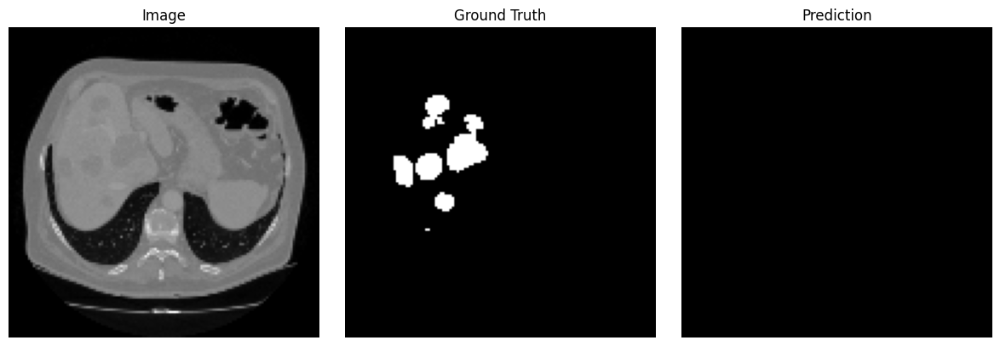


🔧 Trying: LR=0.001, OPT=adam, SIZE=256, BS=4, EPOCHS=60, LOSS=bce_safe
Epoch 1/60
454/454 [==============================] - 28s 49ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.1564 - val_dice_coef: 5.6542e-11 - val_iou_score: 5.6542e-11
Epoch 2/60
454/454 [==============================] - 21s 47ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.1549 - val_dice_coef: 4.0658e-09 - val_iou_score: 4.0658e-09
Epoch 3/60
454/454 [==============================] - 22s 48ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.1549 - val_dice_coef: 4.0658e-09 - val_iou_score: 4.0658e-09
Epoch 4/60
454/454 [==============================] - 21s 46ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.1549 - val_dice_coef: 4.0658e-09 - val_iou_score: 4.0658e-09
Epoch 5/60
454/454 [==============================] - 21s 47ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.1549 - val_dice_coef: 4.0658e-09 - val_iou_s

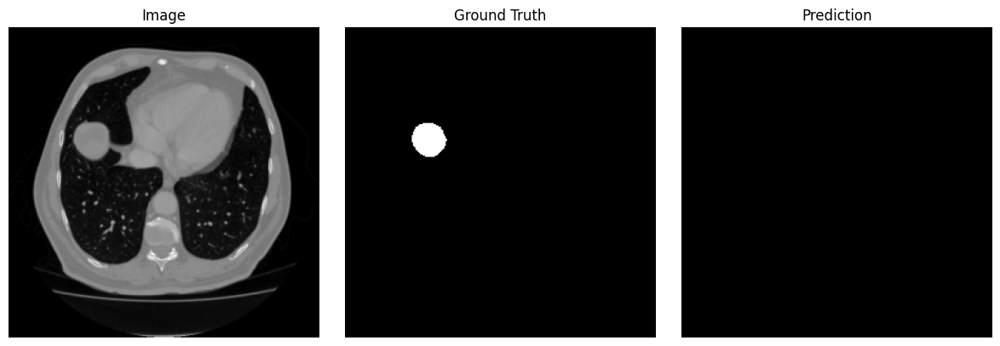


🔧 Trying: LR=1e-05, OPT=rmsprop, SIZE=256, BS=8, EPOCHS=20, LOSS=dice_loss
Epoch 1/20


2025-04-09 09:50:19.495313: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 176.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-04-09 09:50:19.495368: W tensorflow/core/kernels/gpu_utils.cc:54] Failed to allocate memory for convolution redzone checking; skipping this check. This is benign and only means that we won't check cudnn for out-of-bounds reads and writes. This message will only be printed once.
2025-04-09 09:50:19.508402: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 528.03MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-04-09 09:50:19.511526: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out

227/227 [==============================] - 30s 95ms/step - loss: 0.9499 - dice_coef: 0.0501 - iou_score: 0.0258 - val_loss: 0.9241 - val_dice_coef: 0.0682 - val_iou_score: 0.0357
Epoch 2/20
227/227 [==============================] - 21s 92ms/step - loss: 0.9399 - dice_coef: 0.0601 - iou_score: 0.0312 - val_loss: 0.9123 - val_dice_coef: 0.0877 - val_iou_score: 0.0491
Epoch 3/20
227/227 [==============================] - 21s 93ms/step - loss: 0.9345 - dice_coef: 0.0655 - iou_score: 0.0341 - val_loss: 0.9392 - val_dice_coef: 0.0608 - val_iou_score: 0.0336
Epoch 4/20
227/227 [==============================] - 20s 89ms/step - loss: 0.9296 - dice_coef: 0.0704 - iou_score: 0.0368 - val_loss: 0.9843 - val_dice_coef: 0.0157 - val_iou_score: 0.0083
Epoch 5/20
227/227 [==============================] - 20s 89ms/step - loss: 0.9230 - dice_coef: 0.0770 - iou_score: 0.0404 - val_loss: 0.9926 - val_dice_coef: 0.0074 - val_iou_score: 0.0039
Epoch 6/20
227/227 [==============================] - 19s 83m

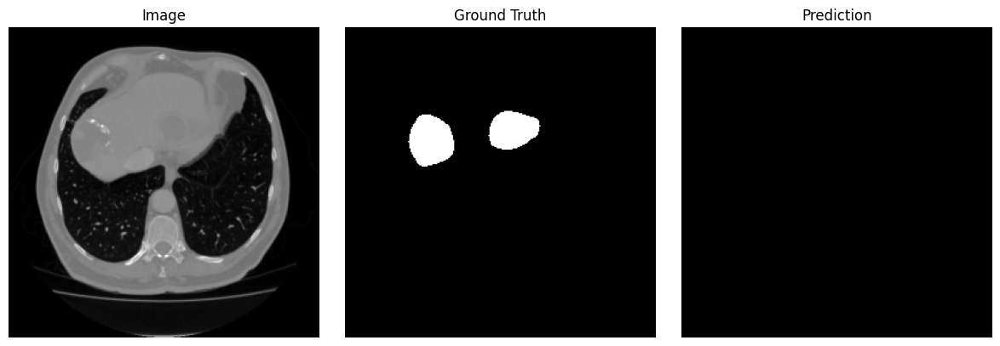


🔧 Trying: LR=0.01, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=100, LOSS=dice_loss
Epoch 1/100
454/454 [==============================] - 28s 51ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.8971 - val_dice_coef: 0.0977 - val_iou_score: 0.0524
Epoch 2/100
454/454 [==============================] - 22s 48ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9137 - val_dice_coef: 0.0863 - val_iou_score: 0.0495
Epoch 3/100
454/454 [==============================] - 19s 43ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9137 - val_dice_coef: 0.0863 - val_iou_score: 0.0495
Epoch 4/100
454/454 [==============================] - 21s 45ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9137 - val_dice_coef: 0.0863 - val_iou_score: 0.0495
Epoch 5/100
454/454 [==============================] - 21s 46ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9137 - val_dice_coef: 0.0863 - val_iou_score: 0.0495
Epoch 6/100
45

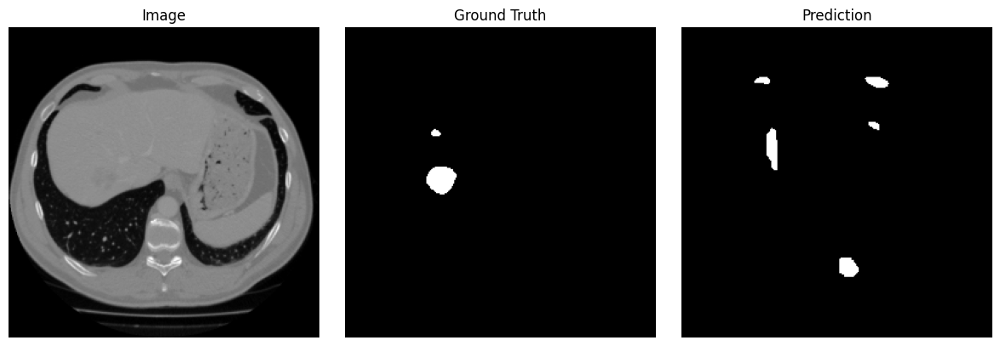


🔧 Trying: LR=0.0001, OPT=rmsprop, SIZE=512, BS=2, EPOCHS=60, LOSS=dice_loss
Epoch 1/60


2025-04-09 10:05:33.328009: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 368.16MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-04-09 10:05:33.382740: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 176.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-04-09 10:05:33.395998: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 528.03MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-04-09 10:05:33.399197: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocato

908/908 [==============================] - 45s 41ms/step - loss: 0.9149 - dice_coef: 0.0851 - iou_score: 0.0465 - val_loss: 0.9970 - val_dice_coef: 0.0029 - val_iou_score: 0.0015
Epoch 2/60
908/908 [==============================] - 36s 39ms/step - loss: 0.8851 - dice_coef: 0.1149 - iou_score: 0.0647 - val_loss: 0.9971 - val_dice_coef: 0.0029 - val_iou_score: 0.0015
Epoch 3/60
908/908 [==============================] - 36s 40ms/step - loss: 0.8762 - dice_coef: 0.1238 - iou_score: 0.0706 - val_loss: 0.9982 - val_dice_coef: 0.0018 - val_iou_score: 9.2160e-04
Epoch 4/60
908/908 [==============================] - 36s 40ms/step - loss: 0.8628 - dice_coef: 0.1372 - iou_score: 0.0795 - val_loss: 0.9962 - val_dice_coef: 0.0038 - val_iou_score: 0.0019
Epoch 5/60
908/908 [==============================] - 36s 40ms/step - loss: 0.8583 - dice_coef: 0.1417 - iou_score: 0.0817 - val_loss: 0.9953 - val_dice_coef: 0.0047 - val_iou_score: 0.0024
Epoch 6/60
908/908 [==============================] - 36s

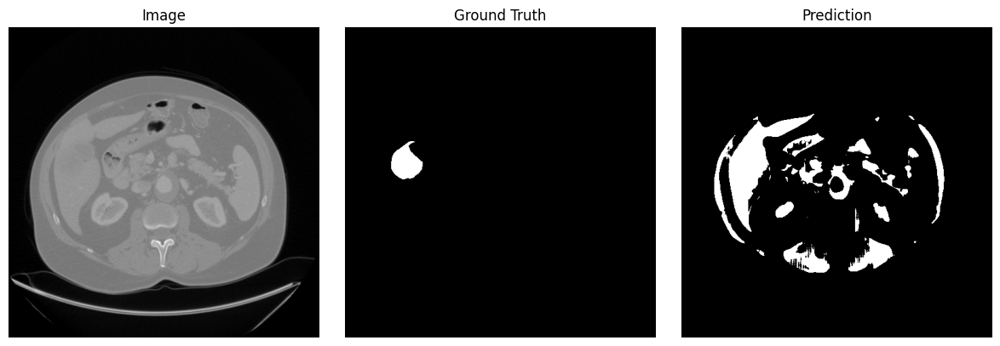


🔧 Trying: LR=1e-05, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=40, LOSS=dice_loss
Epoch 1/40
454/454 [==============================] - 26s 45ms/step - loss: 0.9460 - dice_coef: 0.0540 - iou_score: 0.0281 - val_loss: 0.9105 - val_dice_coef: 0.0856 - val_iou_score: 0.0459
Epoch 2/40
454/454 [==============================] - 22s 48ms/step - loss: 0.9331 - dice_coef: 0.0669 - iou_score: 0.0352 - val_loss: 0.9759 - val_dice_coef: 0.0241 - val_iou_score: 0.0127
Epoch 3/40
454/454 [==============================] - 21s 46ms/step - loss: 0.9231 - dice_coef: 0.0769 - iou_score: 0.0408 - val_loss: 0.9938 - val_dice_coef: 0.0062 - val_iou_score: 0.0032
Epoch 4/40
454/454 [==============================] - 21s 46ms/step - loss: 0.9160 - dice_coef: 0.0840 - iou_score: 0.0449 - val_loss: 0.9979 - val_dice_coef: 0.0021 - val_iou_score: 0.0011
Epoch 5/40
454/454 [==============================] - 21s 47ms/step - loss: 0.9045 - dice_coef: 0.0955 - iou_score: 0.0515 - val_loss: 0.9985 - val_dice_coef: 0.001

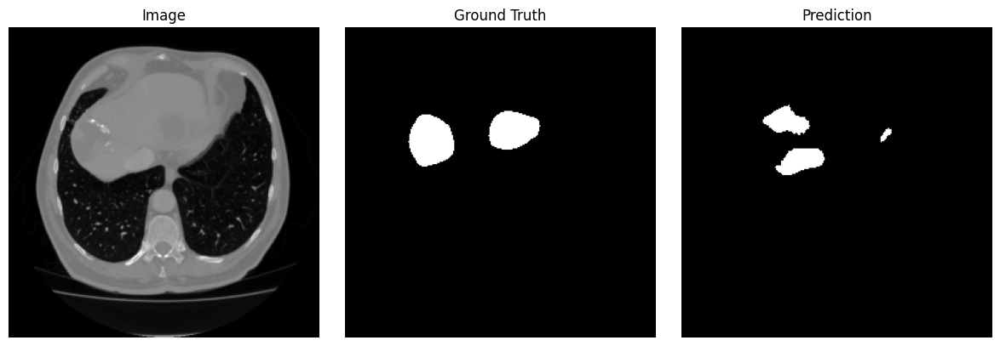


🔧 Trying: LR=1e-05, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=60, LOSS=dice_loss
Epoch 1/60
454/454 [==============================] - 28s 48ms/step - loss: 0.9459 - dice_coef: 0.0541 - iou_score: 0.0282 - val_loss: 0.9112 - val_dice_coef: 0.0845 - val_iou_score: 0.0448
Epoch 2/60
454/454 [==============================] - 21s 47ms/step - loss: 0.9333 - dice_coef: 0.0667 - iou_score: 0.0350 - val_loss: 0.9607 - val_dice_coef: 0.0393 - val_iou_score: 0.0213
Epoch 3/60
454/454 [==============================] - 21s 46ms/step - loss: 0.9245 - dice_coef: 0.0755 - iou_score: 0.0400 - val_loss: 0.9950 - val_dice_coef: 0.0050 - val_iou_score: 0.0026
Epoch 4/60
454/454 [==============================] - 22s 47ms/step - loss: 0.9148 - dice_coef: 0.0852 - iou_score: 0.0455 - val_loss: 0.9964 - val_dice_coef: 0.0036 - val_iou_score: 0.0019
Epoch 5/60
454/454 [==============================] - 21s 45ms/step - loss: 0.9056 - dice_coef: 0.0944 - iou_score: 0.0509 - val_loss: 0.9982 - val_dice_coef: 0.001

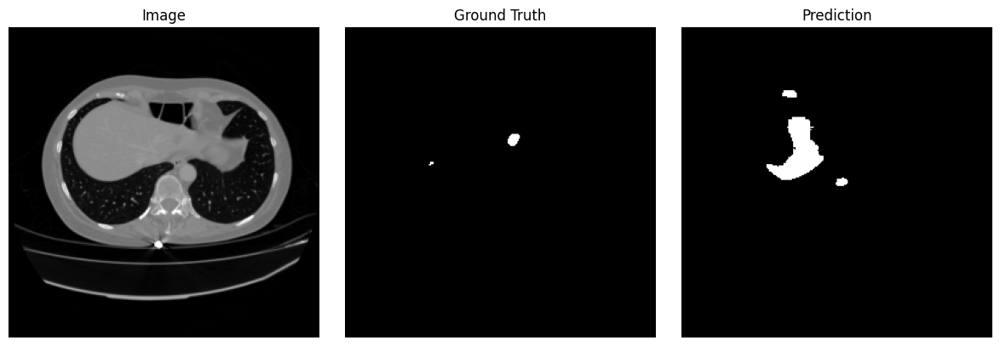


🔧 Trying: LR=1e-05, OPT=rmsprop, SIZE=256, BS=8, EPOCHS=40, LOSS=dice_loss
Epoch 1/40


2025-04-09 10:47:08.216920: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 160.00MiB (rounded to 167772160)requested by op gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 10:47:08.218004: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 10:47:08.218031: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 2281, Chunks in use: 2281. 570.2KiB allocated for chunks. 570.2KiB in use in bin. 322.5KiB client-requested in use in bin.
2025-04-09 10:47:08.218045: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 534, Chunks in use: 534. 279.8KiB allocated for chunks. 279.8KiB in use in bin. 267.0KiB client-requested in use

 Error during trial: Graph execution error:

Detected at node gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/l

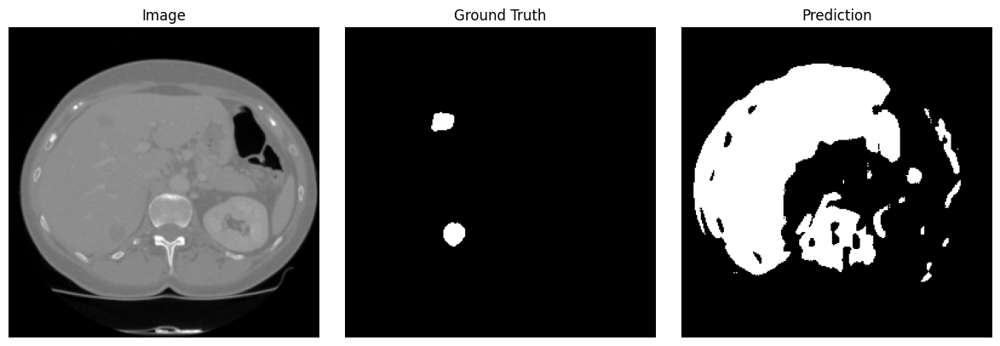


🔧 Trying: LR=0.0001, OPT=rmsprop, SIZE=512, BS=2, EPOCHS=80, LOSS=bce_safe
Epoch 1/80


2025-04-09 10:56:36.047486: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 160.00MiB (rounded to 167772160)requested by op gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 10:56:36.048437: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 10:56:36.048461: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 2400, Chunks in use: 2400. 600.0KiB allocated for chunks. 600.0KiB in use in bin. 339.6KiB client-requested in use in bin.
2025-04-09 10:56:36.048480: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 563, Chunks in use: 562. 295.0KiB allocated for chunks. 294.2KiB in use in bin. 281.0KiB client-requested in use

 Error during trial: Graph execution error:

Detected at node gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/l

2025-04-09 10:56:55.136915: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 160.00MiB (rounded to 167772160)requested by op gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 10:56:55.137616: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 10:56:55.137640: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 2456, Chunks in use: 2455. 614.0KiB allocated for chunks. 613.8KiB in use in bin. 348.1KiB client-requested in use in bin.
2025-04-09 10:56:55.137654: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 576, Chunks in use: 576. 301.5KiB allocated for chunks. 301.5KiB in use in bin. 288.0KiB client-requested in use

 Error during trial: Graph execution error:

Detected at node gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/l

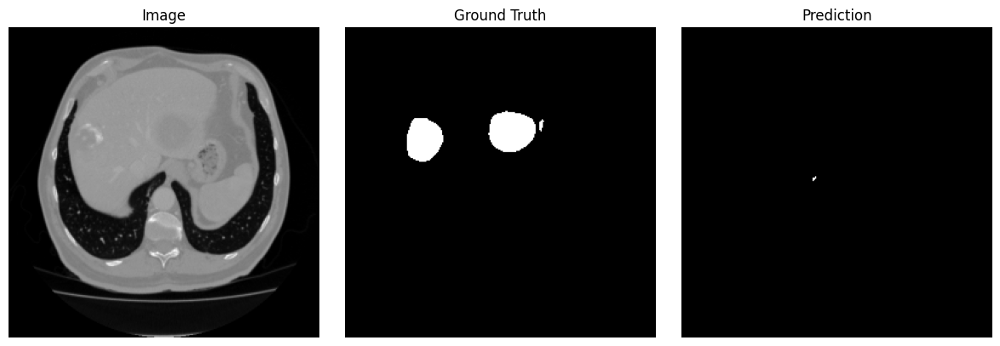


🔧 Trying: LR=1e-05, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=40, LOSS=dice_loss
Epoch 1/40
454/454 [==============================] - 28s 47ms/step - loss: 0.9462 - dice_coef: 0.0538 - iou_score: 0.0280 - val_loss: 0.9042 - val_dice_coef: 0.1044 - val_iou_score: 0.0565
Epoch 2/40
454/454 [==============================] - 20s 45ms/step - loss: 0.9335 - dice_coef: 0.0665 - iou_score: 0.0350 - val_loss: 0.9681 - val_dice_coef: 0.0319 - val_iou_score: 0.0171
Epoch 3/40
454/454 [==============================] - 22s 48ms/step - loss: 0.9245 - dice_coef: 0.0755 - iou_score: 0.0400 - val_loss: 0.9928 - val_dice_coef: 0.0072 - val_iou_score: 0.0038
Epoch 4/40
454/454 [==============================] - 21s 47ms/step - loss: 0.9153 - dice_coef: 0.0847 - iou_score: 0.0452 - val_loss: 0.9986 - val_dice_coef: 0.0014 - val_iou_score: 7.1842e-04
Epoch 5/40
454/454 [==============================] - 22s 48ms/step - loss: 0.9044 - dice_coef: 0.0956 - iou_score: 0.0516 - val_loss: 0.9982 - val_dice_coef: 0

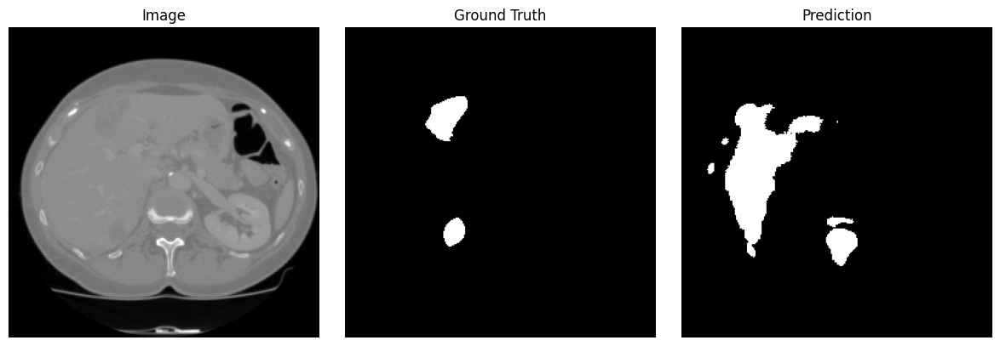


🔧 Trying: LR=0.01, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=80, LOSS=dice_loss
Epoch 1/80
454/454 [==============================] - 27s 48ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.8785 - val_dice_coef: 0.1330 - val_iou_score: 0.0745
Epoch 2/80
454/454 [==============================] - 21s 46ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9131 - val_dice_coef: 0.0869 - val_iou_score: 0.0501
Epoch 3/80
454/454 [==============================] - 21s 47ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9131 - val_dice_coef: 0.0869 - val_iou_score: 0.0501
Epoch 4/80
454/454 [==============================] - 22s 49ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9131 - val_dice_coef: 0.0869 - val_iou_score: 0.0501
Epoch 5/80
454/454 [==============================] - 21s 47ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9131 - val_dice_coef: 0.0869 - val_iou_score: 0.0501
Epoch 6/80
454/454 [

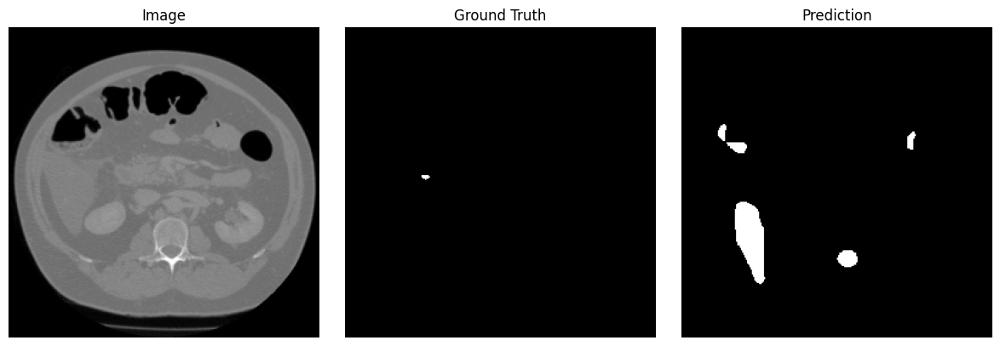


🔧 Trying: LR=0.0001, OPT=rmsprop, SIZE=512, BS=2, EPOCHS=80, LOSS=dice_loss
Epoch 1/80


2025-04-09 11:36:43.173670: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 16.00MiB (rounded to 16777216)requested by op UNetPP/X13/dropout/Mul
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 11:36:43.174677: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 11:36:43.174712: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 2698, Chunks in use: 2691. 674.5KiB allocated for chunks. 672.8KiB in use in bin. 382.3KiB client-requested in use in bin.
2025-04-09 11:36:43.174727: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 635, Chunks in use: 632. 333.5KiB allocated for chunks. 332.0KiB in use in bin. 316.0KiB client-requested in use in bin.
2025-04-09 11:36:43.174739:

 Error during trial: Graph execution error:

Detected at node UNetPP/X13/dropout/Mul defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/

2025-04-09 11:37:12.867520: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 64.00MiB (rounded to 67108864)requested by op UNetPP/concat13/concat
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 11:37:12.868359: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 11:37:12.868385: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 2757, Chunks in use: 2749. 689.2KiB allocated for chunks. 687.2KiB in use in bin. 391.1KiB client-requested in use in bin.
2025-04-09 11:37:12.868400: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 647, Chunks in use: 646. 339.8KiB allocated for chunks. 339.2KiB in use in bin. 323.0KiB client-requested in use in bin.
2025-04-09 11:37:12.868413:

 Error during trial: Graph execution error:

Detected at node UNetPP/concat13/concat defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/

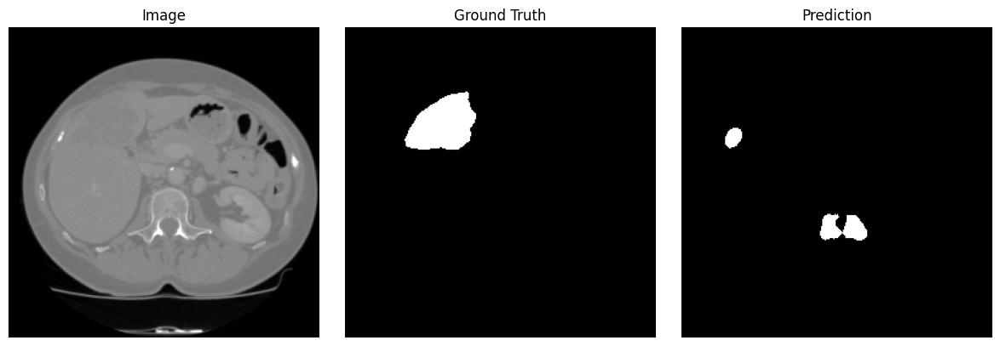


🔧 Trying: LR=0.0001, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=60, LOSS=dice_loss
Epoch 1/60
454/454 [==============================] - 27s 47ms/step - loss: 0.9044 - dice_coef: 0.0956 - iou_score: 0.0517 - val_loss: 0.9893 - val_dice_coef: 0.0102 - val_iou_score: 0.0052
Epoch 2/60
454/454 [==============================] - 22s 47ms/step - loss: 0.8626 - dice_coef: 0.1374 - iou_score: 0.0772 - val_loss: 0.9919 - val_dice_coef: 0.0081 - val_iou_score: 0.0045
Epoch 3/60
454/454 [==============================] - 22s 47ms/step - loss: 0.8443 - dice_coef: 0.1557 - iou_score: 0.0889 - val_loss: 0.9933 - val_dice_coef: 0.0067 - val_iou_score: 0.0037
Epoch 4/60
454/454 [==============================] - 21s 47ms/step - loss: 0.8328 - dice_coef: 0.1672 - iou_score: 0.0972 - val_loss: 0.9938 - val_dice_coef: 0.0062 - val_iou_score: 0.0033
Epoch 5/60
454/454 [==============================] - 19s 42ms/step - loss: 0.8278 - dice_coef: 0.1722 - iou_score: 0.1012 - val_loss: 0.9992 - val_dice_coef: 8.37

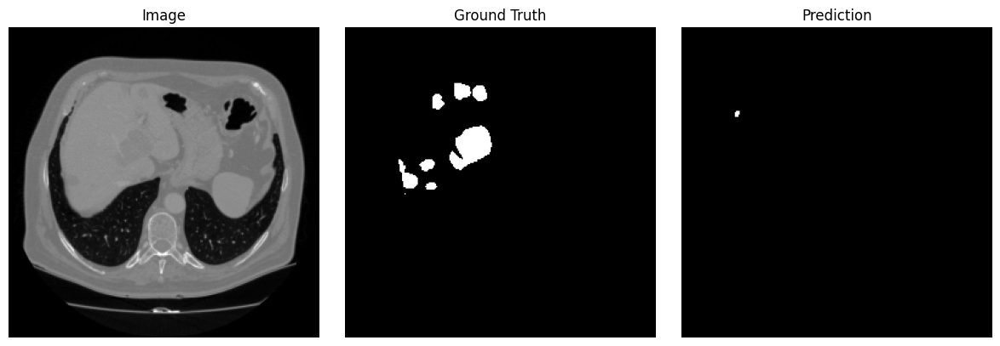


🔧 Trying: LR=0.001, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=80, LOSS=dice_loss
Epoch 1/80
454/454 [==============================] - 28s 48ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9993 - val_dice_coef: 6.8698e-04 - val_iou_score: 3.4526e-04
Epoch 2/80
454/454 [==============================] - 22s 49ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9983 - val_dice_coef: 0.0017 - val_iou_score: 8.6588e-04
Epoch 3/80
454/454 [==============================] - 22s 49ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9959 - val_dice_coef: 0.0041 - val_iou_score: 0.0022
Epoch 4/80
454/454 [==============================] - 22s 47ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9953 - val_dice_coef: 0.0047 - val_iou_score: 0.0025
Epoch 5/80
454/454 [==============================] - 21s 47ms/step - loss: nan - dice_coef: nan - iou_score: nan - val_loss: 0.9953 - val_dice_coef: 0.0047 - val_iou_score: 0.0025
Epoch 6

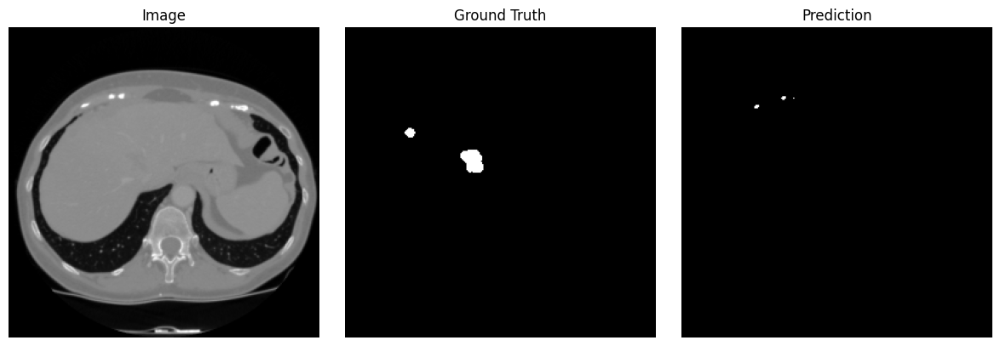


🔧 Trying: LR=0.0001, OPT=rmsprop, SIZE=512, BS=2, EPOCHS=80, LOSS=dice_loss
Epoch 1/80


2025-04-09 12:17:59.718260: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 128.00MiB (rounded to 134217728)requested by op UNetPP/concat03/concat
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 12:17:59.719268: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 12:17:59.719291: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 2990, Chunks in use: 2988. 747.5KiB allocated for chunks. 747.0KiB in use in bin. 425.5KiB client-requested in use in bin.
2025-04-09 12:17:59.719305: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 706, Chunks in use: 702. 371.2KiB allocated for chunks. 369.0KiB in use in bin. 351.0KiB client-requested in use in bin.
2025-04-09 12:17:59.71931

 Error during trial: Graph execution error:

Detected at node UNetPP/concat03/concat defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/

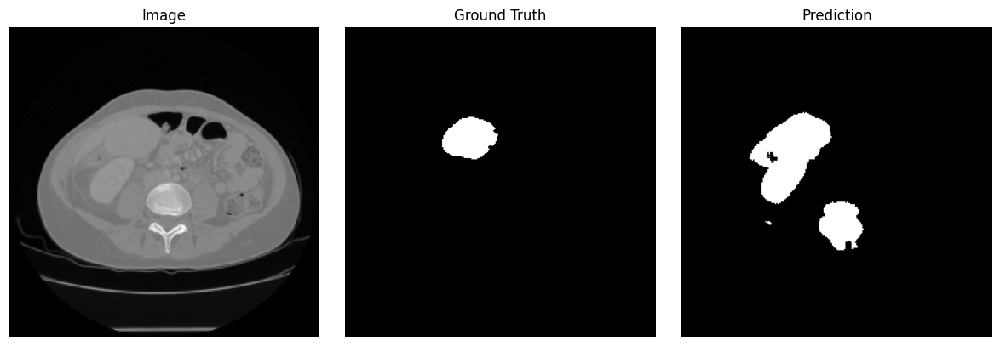


🔧 Trying: LR=0.0001, OPT=sgd, SIZE=256, BS=4, EPOCHS=60, LOSS=dice_loss
Epoch 1/60
454/454 [==============================] - 29s 51ms/step - loss: 0.9590 - dice_coef: 0.0410 - iou_score: 0.0211 - val_loss: 0.9948 - val_dice_coef: 0.0049 - val_iou_score: 0.0025
Epoch 2/60
454/454 [==============================] - 23s 50ms/step - loss: 0.9577 - dice_coef: 0.0423 - iou_score: 0.0219 - val_loss: 0.9936 - val_dice_coef: 0.0064 - val_iou_score: 0.0032
Epoch 3/60
454/454 [==============================] - 21s 47ms/step - loss: 0.9566 - dice_coef: 0.0434 - iou_score: 0.0225 - val_loss: 0.9914 - val_dice_coef: 0.0086 - val_iou_score: 0.0043
Epoch 4/60
454/454 [==============================] - 21s 46ms/step - loss: 0.9553 - dice_coef: 0.0447 - iou_score: 0.0232 - val_loss: 0.9890 - val_dice_coef: 0.0110 - val_iou_score: 0.0056
Epoch 5/60
454/454 [==============================] - 19s 43ms/step - loss: 0.9550 - dice_coef: 0.0450 - iou_score: 0.0233 - val_loss: 0.9860 - val_dice_coef: 0.0140 -

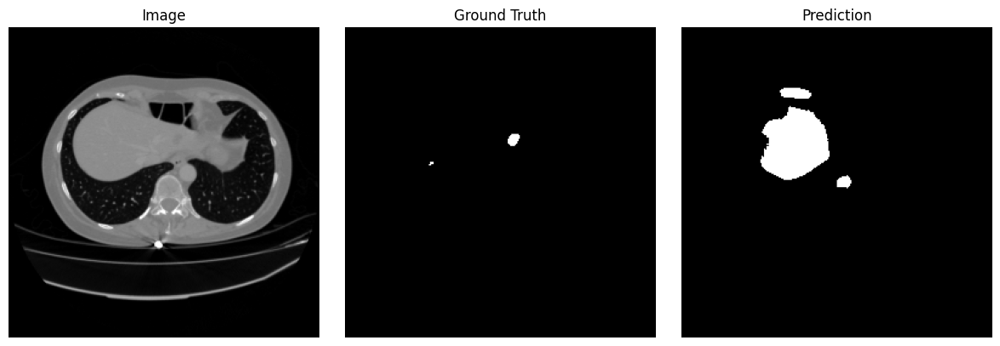


🔧 Trying: LR=0.0001, OPT=rmsprop, SIZE=256, BS=4, EPOCHS=60, LOSS=dice_loss
Epoch 1/60


2025-04-09 12:50:19.672074: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 80.00MiB (rounded to 83886080)requested by op gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 12:50:19.672535: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 12:50:19.672574: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 3161, Chunks in use: 3160. 790.2KiB allocated for chunks. 790.0KiB in use in bin. 450.7KiB client-requested in use in bin.
2025-04-09 12:50:19.672589: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 744, Chunks in use: 744. 390.5KiB allocated for chunks. 390.5KiB in use in bin. 372.0KiB client-requested in use i

 Error during trial: Graph execution error:

Detected at node gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/l

2025-04-09 12:50:40.516836: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 80.00MiB (rounded to 83886080)requested by op gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 12:50:40.517361: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 12:50:40.517386: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 3217, Chunks in use: 3217. 804.2KiB allocated for chunks. 804.2KiB in use in bin. 459.3KiB client-requested in use in bin.
2025-04-09 12:50:40.517401: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 758, Chunks in use: 758. 397.8KiB allocated for chunks. 397.8KiB in use in bin. 379.0KiB client-requested in use i

 Error during trial: Graph execution error:

Detected at node gradient_tape/UNetPP/conv04_1/Conv2D/Conv2DBackpropInput defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/l

2025-04-09 12:51:01.184143: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 16.00MiB (rounded to 16777216)requested by op UNetPP/X12_/dropout/random_uniform/RandomUniform
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 12:51:01.184661: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 12:51:01.184693: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 3284, Chunks in use: 3283. 821.0KiB allocated for chunks. 820.8KiB in use in bin. 469.2KiB client-requested in use in bin.
2025-04-09 12:51:01.184763: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 776, Chunks in use: 772. 407.5KiB allocated for chunks. 405.0KiB in use in bin. 386.0KiB client-requested in use in bin.
2

 Error during trial: Graph execution error:

Detected at node UNetPP/X12_/dropout/random_uniform/RandomUniform defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/local/lib

2025-04-09 12:51:32.161359: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 80.00MiB (rounded to 83886080)requested by op UNetPP/concat04/concat
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 12:51:32.161855: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 12:51:32.161878: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 3336, Chunks in use: 3328. 834.0KiB allocated for chunks. 832.0KiB in use in bin. 476.2KiB client-requested in use in bin.
2025-04-09 12:51:32.161892: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 791, Chunks in use: 786. 415.2KiB allocated for chunks. 412.2KiB in use in bin. 393.0KiB client-requested in use in bin.
2025-04-09 12:51:32.161905:

 Error during trial: Graph execution error:

Detected at node UNetPP/concat04/concat defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/

2025-04-09 12:51:53.310065: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 16.00MiB (rounded to 16777216)requested by op UNetPP/upsample04/conv2d_transpose
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-04-09 12:51:53.310554: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-04-09 12:51:53.310573: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 3390, Chunks in use: 3385. 847.5KiB allocated for chunks. 846.2KiB in use in bin. 484.8KiB client-requested in use in bin.
2025-04-09 12:51:53.310582: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 803, Chunks in use: 800. 421.5KiB allocated for chunks. 419.5KiB in use in bin. 400.0KiB client-requested in use in bin.
2025-04-09 12:5

 Error during trial: Graph execution error:

Detected at node UNetPP/upsample04/conv2d_transpose defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1046, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 736, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 516, in dispatch_queue

  File "/usr/local/lib/python3.11/di

In [ ]:
import csv
import gc
import sys
import numpy as np
import tensorflow as tf
import importlib.util
from pyswarm import pso
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import mixed_precision
import matplotlib.pyplot as plt

# ✅ Enable mixed precision
mixed_precision.set_global_policy('mixed_float16')

# ✅ Dynamically load UNet++ model
module_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", module_path)
unetpp_module = importlib.util.module_from_spec(spec)
sys.modules["UNetPP"] = unetpp_module
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

#  Hyperparameter search spaces
image_sizes = [128, 256, 512]
batch_size_map = {128: [4, 8], 256: [4, 8], 512: [2, 4]}
loss_map = {0: dice_loss, 1: bce_safe, 2: dice_bce_loss}
loss_names = ['dice', 'bce', 'dice_bce']
optimizers = ['adam', 'rmsprop', 'sgd']
learning_rates = [1e-5, 1e-4, 1e-3, 1e-2]
epochs_list = [20, 40, 60, 80, 100]

#  Optional logging
def log_trial(params, best_dice, std_dice):
    with open("pso_results.csv", "a", newline='') as f:
        writer = csv.writer(f)
        writer.writerow(params + [best_dice, std_dice])

#  PSO objective function
# Updated version of your PSO script with:
#  no pretrained weights
#  all layers trainable
# per-epoch Dice printout
# prediction + mask visual inspection after 1 epoch

def evaluate_model(x):
    try:
        lr = learning_rates[int(x[0])]
        opt_name = optimizers[int(x[1])]
        img_size = image_sizes[int(x[2])]
        batch_size = batch_size_map[img_size][int(x[3])]
        loss_fn = loss_map[int(x[4])]
        epochs = epochs_list[int(x[5])]
        loss_name = loss_fn.__name__ if hasattr(loss_fn, '__name__') else str(loss_fn)

        print(f"\n🔧 Trying: LR={lr}, OPT={opt_name}, SIZE={img_size}, BS={batch_size}, EPOCHS={epochs}, LOSS={loss_name}")

        train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
        valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=True)

        model_builder = UNetPlusPlus(input_shape=(img_size, img_size, 1), deep_supervision=False)
        model = model_builder.BuildNetwork()

        # ✅ Load pretrained weights
        model.load_weights("/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5")

        # ✅ Freeze encoder
        for layer in model.layers:
            if "upsample" in layer.name:
                break
            layer.trainable = False



        # Optimizer selection
        if opt_name == 'adam':
            optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=1.0)
        elif opt_name == 'rmsprop':
            optimizer = tf.keras.optimizers.RMSprop(learning_rate=lr, clipnorm=1.0)
        else:
            optimizer = tf.keras.optimizers.SGD(learning_rate=lr, clipnorm=1.0)

        model.compile(optimizer=optimizer, loss=loss_fn, metrics=[dice_coef, iou_score])

        #  Print Dice every epoch (verbose=1)
        history = model.fit(
            train_gen,
            validation_data=valid_gen,
            epochs=epochs,
            callbacks=[EarlyStopping(monitor='val_dice_coef', patience=20, min_delta=0.001, mode='max', restore_best_weights=True)],
            verbose=1
        )

        val_dice = history.history.get('val_dice_coef', [])
        best_val_dice = max(val_dice) if val_dice else 0.0
        dice_std = np.std(val_dice) if val_dice else 0.0

        score = best_val_dice - (0.05 * dice_std)
        print(f" Best Dice: {best_val_dice:.4f} | Std: {dice_std:.4f} | Score: {score:.4f}")
        log_trial(x.tolist(), best_val_dice, dice_std)

        #  Visualize predictions after first epoch
        sample_images, sample_masks = next(iter(valid_gen))
        preds = model.predict(sample_images)
        preds_bin = (preds > 0.5).astype(np.float32)

        for i in range(min(2, len(sample_images))):
            plt.figure(figsize=(12, 4))
            plt.subplot(1, 3, 1)
            plt.imshow(sample_images[i].squeeze(), cmap='gray')
            plt.title("Image")
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(sample_masks[i].squeeze(), cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(preds_bin[i].squeeze(), cmap='gray')
            plt.title("Prediction")
            plt.axis('off')

            plt.tight_layout()
            plt.show()

    except Exception as e:
        print(f" Error during trial: {e}")
        score = 0.0

    tf.keras.backend.clear_session()
    gc.collect()
    return -score


# PSO bounds
lb = [0, 0, 0, 0, 0, 0]
ub = [3, 2, 2, 1, 2, 4]

#  Run PSO
best_params, best_score = pso(evaluate_model, lb, ub, swarmsize=5, maxiter=5)

#  Interpret best config
img_index = int(best_params[2])
img_size = image_sizes[img_index]
batch_index = int(best_params[3])
batch_size = batch_size_map[img_size][batch_index]

print("\n Best Hyperparameters Found:")
print(f"🔹 Learning Rate: {learning_rates[int(best_params[0])]}")
print(f"🔹 Optimizer: {optimizers[int(best_params[1])]}")
print(f"🔹 Image Size: {img_size}")
print(f"🔹 Batch Size: {batch_size}")
print(f"🔹 Loss Function: {loss_names[int(best_params[4])]}")
print(f"🔹 Epochs: {epochs_list[int(best_params[5])]}")
print(f" Best Validation Dice Score: {-best_score:.4f}")

